<a href="https://colab.research.google.com/github/merzechan/Predicting-Diseases-in-Chinese-Cabbage/blob/main/Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
import pandas as pd
import numpy as np
import os, datetime
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import re
!pip install split-folders
import splitfolders

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import plot_confusion_matrix, classification_report, confusion_matrix

import tensorflow as tf
import tensorflow_hub as hub
import tensorboard as tb
import tensorflow_datasets as tfds
from tensorflow.keras import layers, utils
from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

!pip install lime
from lime import lime_image

RANDOM_STATE = np.random.RandomState(0)

from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [52]:
TRAIN_DIR = '/content/gdrive/My Drive/bok_choy/train/'
TEST_DIR = '/content/gdrive/My Drive/bok_choy/test/'

TRAIN_PATH="/content/gdrive/MyDrive/bok_choy/split/train"
VAL_PATH="/content/gdrive/MyDrive/bok_choy/split/val"

In [53]:
# Train/Validation split by folder

#run this code only once
#splitfolders.ratio(TRAIN_DIR, output="/content/gdrive/My Drive/bok_choy/split", seed=RANDOM_STATE, ratio=(0.8, 0.2)) 

In [54]:
train_set = preprocessing.image_dataset_from_directory("/content/gdrive/MyDrive/bok_choy/split/train")
len(train_set)

Found 2301 files belonging to 3 classes.


72

In [55]:
# Define image size
IMG_SIZE = 224

# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(preprocessing.image_dataset_from_directory(TRAIN_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE)).class_names)

# Setup model URL from TensorFlow Hub
MobileNetV2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
EfficientNetB0 = "https://tfhub.dev/tensorflow/efficientnet/b0/classification/1"
MobileNetV3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5"
InceptionV3 = "https://tfhub.dev/google/imagenet/inception_v3/classification/5"
EfficientNetB5 = 'https://tfhub.dev/tensorflow/efficientnet/b5/classification/1' #img_size=456

# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_auc",
                                                  patience=4)

# Tensorboard Logs path
LOGS = "/content/gdrive/My Drive/bok_choy/logs"

# Setup TensorBoard
file_writer = tf.summary.create_file_writer(LOGS)


Found 2301 files belonging to 3 classes.


In [56]:
df = pd.read_csv("/content/gdrive/My Drive/bok_choy/train.csv")
print(df.describe())
print(df.head())

       has_backmoth  has_leafminer   has_mildew
count   2878.000000    2878.000000  2878.000000
mean       0.623002       0.115705     0.261293
std        0.484719       0.319927     0.439415
min        0.000000       0.000000     0.000000
25%        0.000000       0.000000     0.000000
50%        1.000000       0.000000     0.000000
75%        1.000000       0.000000     1.000000
max        1.000000       1.000000     1.000000
          id  has_backmoth  has_leafminer  has_mildew
0  Backmoth1             1              0           0
1  Backmoth2             1              0           0
2  Backmoth3             1              0           0
3  Backmoth4             1              0           0
4  Backmoth5             1              0           0


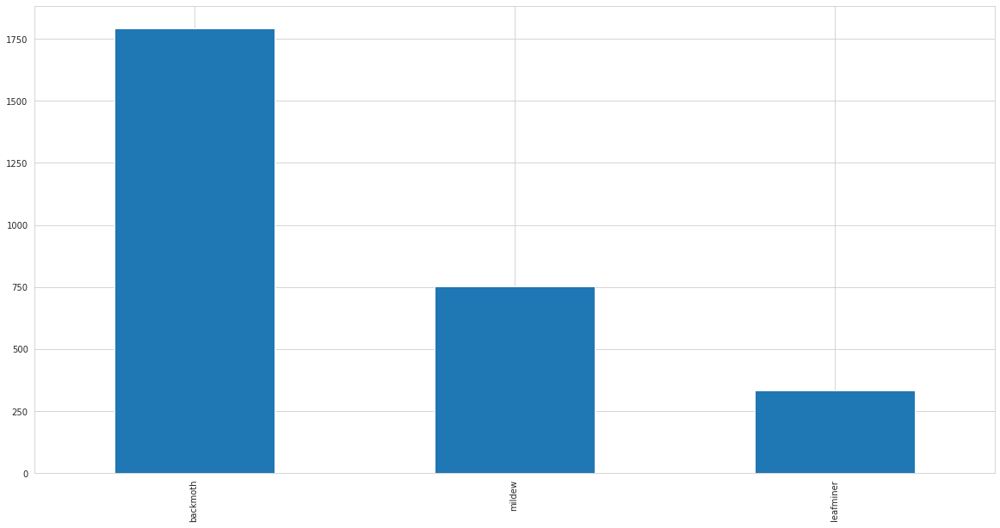

In [57]:
# Create function to undummify categorical labels
def undummify(df, prefix_sep="_"):
    cols2collapse = {
        item.split(prefix_sep)[0]: (prefix_sep in item) for item in df.columns
    }
    series_list = []
    for col, needs_to_collapse in cols2collapse.items():
        if needs_to_collapse:
            undummified = (
                df.filter(like=col)
                .idxmax(axis=1)
                .apply(lambda x: x.split(prefix_sep, maxsplit=1)[1])
                .rename(col)
            )
            series_list.append(undummified)
        else:
            series_list.append(df[col])
    undummified_df = pd.concat(series_list, axis=1)
    return undummified_df

sns.set_style('whitegrid')
undummify(df)['has'].value_counts().plot.bar(figsize=(20, 10))

In [58]:
filenames=[]
labels=[]
for root, dirs, files in os.walk(TRAIN_PATH, topdown=True):
  for name in files:
      filenames.append(os.path.join(root, name))
      labels.append(name)

In [59]:
labels[:10]

['Backmoth1594.jpg',
 'Backmoth158.jpg',
 'Backmoth1584.jpg',
 'Backmoth15.jpg',
 'Backmoth1485.jpg',
 'Backmoth1589.jpg',
 'Backmoth1541.jpg',
 'Backmoth1477.jpg',
 'Backmoth1484.jpg',
 'Backmoth1524.jpg']

In [60]:
labels = [re.split(r'(\d+)', s)[0].lower() for s in labels]
labels[:10]

['backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth',
 'backmoth']

In [61]:
train_data = preprocessing.image_dataset_from_directory(TRAIN_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE),
                                                   seed=123
                                                   )
val_data = preprocessing.image_dataset_from_directory(VAL_PATH,
                                                   image_size=(IMG_SIZE,IMG_SIZE),
                                                   seed=123
                                                   )
train_data.class_names

Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.


['backmoth', 'leafminer', 'mildew']

In [62]:
for image_batch, label_batch in train_data.take(1):
  print(label_batch.numpy())

[2 2 0 2 0 2 2 2 0 1 2 0 0 0 0 0 2 0 0 1 0 2 0 2 2 0 0 1 0 0 1 0]


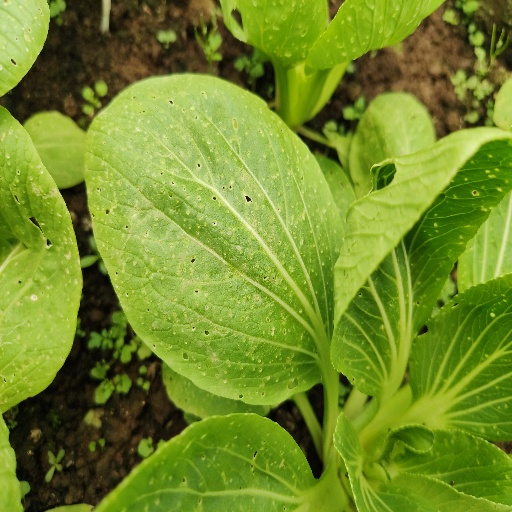

/content/gdrive/MyDrive/bok_choy/split/train/backmoth/Backmoth1645.jpg


In [63]:
display(Image(filenames[123]))
print(filenames[123])

In [64]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [65]:
# Find the unique label values
#unique_disease = list(train_data.class_names)
unique_disease=[]
for i in train_data.class_names:
  unique_disease.append(i)
print("no. of unique diseases:",len(unique_disease))
print(type(unique_disease))
print(unique_disease)

no. of unique diseases: 3
<class 'list'>
['backmoth', 'leafminer', 'mildew']


In [66]:
# Find the unique label values
unique_disease = np.array(train_data.class_names)
print("no. of unique diseases:",len(unique_disease))
print(unique_disease)
type(unique_disease)

no. of unique diseases: 3
['backmoth' 'leafminer' 'mildew']


numpy.ndarray

In [67]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_disease

backmoth


array([ True, False, False])

In [68]:
# Turn every label into a boolean array
boolean_labels = [label == unique_disease for label in labels]
boolean_labels[:10]

[array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False])]

In [69]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_disease == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

backmoth
(array([0]),)
0
[1 0 0]


In [70]:
# Setup X & y variables
#X = filenames
#y = boolean_labels

In [71]:
# Set number of images to use for experimenting
NUM_IMAGES = 3000 #@param {type:"slider", min:500, max:3000, step:500}

In [72]:
# Function to check GPU availability
def gpu_check():
  return print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")



# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label





# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

# Create a function for viewing images in a data batch
def show_15_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  fig, ax = plt.subplots(3,5,figsize=(20,10))
  ax = ax.ravel()
  # Loop through 25 (for displaying 25 images)
  for i in range(15):
    # Display an image 
    ax[i].imshow(images[i].astype(np.uint8))
    # Add the image label as the title
    ax[i].title.set_text(unique_disease[labels[i].argmax()])
    # Turn the grid lines off
    ax[i].axis("off");
  fig.tight_layout()


"""

# Create a function for viewing images in a data batch
def show_15_images(images, labels):
  
  # Displays a plot of 25 images and their labels from a data batch.
  
  # Setup the figure
  plt.figure(figsize=(30, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(15):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 3, i+1)
    # Display an image 
    plt.imshow(images[i].astype(np.uint8))
    # Add the image label as the title
    plt.title(unique_disease[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")



# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MobileNetV2,rescale=True,image_size=IMG_SIZE):
  print("Building model with:", max(model_url.split('/')[4:]))

  # Setup data rescaling
  if rescale:
    resize_rescale = Sequential([
        preprocessing.Resizing(image_size,image_size),
        preprocessing.Rescaling(1./255)
    ], name='resize_rescale')

  else:
    resize_rescale = Sequential([
        preprocessing.Resizing(image_size,image_size),
    ], name='resize_rescale')

  # Setup data augmentation
  data_augmentation = Sequential([
    preprocessing.RandomFlip("horizontal"), # randomly flip images on horizontal edge
    preprocessing.RandomRotation(0.15), # randomly rotate images by a specific amount
    #preprocessing.RandomHeight(0.15), # randomly adjust the height of an image by a specific amount
    #preprocessing.RandomWidth(0.15), # randomly adjust the width of an image by a specific amount
    preprocessing.RandomZoom(0.15), # randomly zoom into an image
    #preprocessing.Rescaling(1./255) # keep for models like ResNet50V2, remove for EfficientNet
    ], name="data_augmentation")

  # Setup the model layers
  model = Sequential([
    resize_rescale,
    #layers.RandomFlip(mode='horizontal'),
    data_augmentation,
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    layers.Dense(units=OUTPUT_SHAPE,
                 activation="softmax",
                 name = "output_layer") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["AUC"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model
"""

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MobileNetV3,image_size=IMG_SIZE):
  print("Building model with:", max(model_url.split('/')[4:]))

   # Setup the model layers
  model = Sequential([
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    layers.Dense(units=OUTPUT_SHAPE,
                 activation="softmax",
                 name = "output_layer") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["AUC"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

# Create a function to build a TensorBoard callback
def create_tensorboard_callback(model_name):
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join(LOGS,
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+model_name)
  return tf.keras.callbacks.TensorBoard(logdir)


# Build a function to train and return a trained model
def train_model(model,model_name):
  
  # Trains a given model and returns the trained version.

  # Create training image generator
  train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=50,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True
    )

  train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH ,
    target_size=(IMG_SIZE,IMG_SIZE),
    batch_size= BATCH_SIZE,
    class_mode="categorical"
    )
  
  # Create validation image generator
  val_datagen = ImageDataGenerator(
    rescale=1./255,
    )

  val_generator = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=(IMG_SIZE,IMG_SIZE),
    batch_size= BATCH_SIZE,
    class_mode="categorical"
    )


  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback(model_name)

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_generator,
            steps_per_epoch= len(preprocessing.image_dataset_from_directory(TRAIN_PATH)),
            epochs=NUM_EPOCHS,
            validation_data=val_generator,
            validation_steps= len(preprocessing.image_dataset_from_directory(VAL_PATH)),
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

"""
# Build a function to train and return a trained model
def train_model(model,model_name):

   # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback(model_name)

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model
"""

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_disease[np.argmax(prediction_probabilities)]


def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_disease[np.argmax(label)])
  return images, labels


def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image.astype(np.uint8))
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_disease[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/gdrive/My Drive/bok_choy/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


# Scores the model via confusion matrix and classification report
def scorer(model): 

    X_val, y_val = unbatchify(val_data)
    X_train, y_train = unbatchify(train_data)
    # Get predictions
    preds = model.predict(val_data, verbose=1)
    
    #with sns.axes_style(style="white"):
    #    plot_confusion_matrix(model, X_val, y_val, cmap='GnBu', values_format='d');

    print("Training Score:",model.evaluate(X_train,y_train))
    print("Validation Score:",model.evaluate(X_val,y_val))
    print("\n")
    print(classification_report(y_val, preds))   

In [73]:
# Split them into training and validation of total size NUM_IMAGES
#X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
#                                                  y[:NUM_IMAGES],
#                                                  random_state=RANDOM_STATE,
#                                                  stratify=y[:NUM_IMAGES])

In [74]:
# Let's have a look at the training data
#X_train[:5], y_train[:5]

In [75]:
# Convert image to NumPy array
image = plt.imread(filenames[42])
image.shape

(512, 512, 3)

In [76]:
image.max(), image.min()

(255, 0)

In [77]:
# Create training and validation data batches
#train_data = create_data_batches(X_train, y_train)
#val_data = create_data_batches(X_val, y_val, valid_data=True)

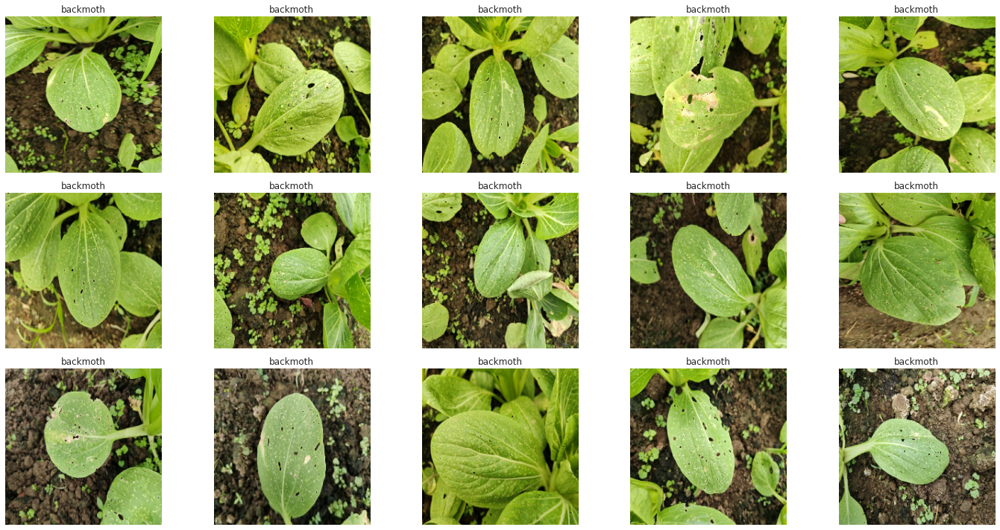

In [78]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_15_images(train_images, train_labels)

In [79]:
NUM_EPOCHS = 50 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
gpu_check()

GPU not available :(


In [ ]:
# Fit EfficientNetB0 model
model_efficientnetB0 = train_model(create_model(model_url=EfficientNetB0),"EfficientNetB0_Baseline")

Building model with: efficientnet
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 860s 12s/step - loss: 1.0612 - auc: 0.7397 - val_loss: 1.0295 - val_auc: 0.7637
Epoch 2/50
72/72 [==============================] - 160s 2s/step - loss: 1.0053 - auc: 0.7613 - val_loss: 0.9830 - val_auc: 0.7755
Epoch 3/50
72/72 [==============================] - 147s 2s/step - loss: 0.9661 - auc: 0.7650 - val_loss: 0.9514 - val_auc: 0.7800
Epoch 4/50
72/72 [==============================] - 148s 2s/step - loss: 0.9395 - auc: 0.7754 - val_loss: 0.9301 - val_auc: 0.7909
Epoch 5/50
72/72 [==============================] - 159s 2s/step - loss: 0.9216 - auc: 0.7807 - val_loss: 0.9156 - val_auc: 0.7919
Epoch 6/50
72/72 [==============================] - 158s 2s/step - loss: 0.9096 - auc: 0.7888 - val_loss: 0.9059 - val_auc: 0.7949
Epoch 7/50
72/7

In [80]:
# Load TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/My\ Drive/bok_choy/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 3)), types: (tf.float32, tf.bool)>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions[:10]

NameError: ignored

In [ ]:
pred_label = get_pred_label(predictions[81])
pred_label

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Fit EfficientNetB0 model
model_mobilenetv2 = train_model(create_model(model_url=MobileNetV2),"MobileNetV2_baseline")

Building model with: mobilenet_v2_130_224
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 135s 2s/step - loss: 0.7663 - auc: 0.8352 - val_loss: 0.6875 - val_auc: 0.8652
Epoch 2/50
72/72 [==============================] - 145s 2s/step - loss: 0.5426 - auc: 0.9228 - val_loss: 0.5772 - val_auc: 0.9109
Epoch 3/50
72/72 [==============================] - 135s 2s/step - loss: 0.4581 - auc: 0.9470 - val_loss: 0.4966 - val_auc: 0.9383
Epoch 4/50
72/72 [==============================] - 147s 2s/step - loss: 0.3996 - auc: 0.9620 - val_loss: 0.4366 - val_auc: 0.9520
Epoch 5/50
72/72 [==============================] - 134s 2s/step - loss: 0.3583 - auc: 0.9707 - val_loss: 0.4110 - val_auc: 0.9606
Epoch 6/50
72/72 [==============================] - 133s 2s/step - loss: 0.3190 - auc: 0.9779 - val_loss: 0.3661 - val_auc: 0.9717
Epoch 7/

In [ ]:
save_model(model_efficientnetB0, suffix="EfficientNetB0_baseline")

Saving model to: /content/gdrive/My Drive/bok_choy/models/20211203-14321638541941-EfficientNetB0_baseline.h5...


'/content/gdrive/My Drive/bok_choy/models/20211203-14321638541941-EfficientNetB0_baseline.h5'

In [ ]:
save_model(model_mobilenetv2, suffix="MobileNetV2_baseline")

Saving model to: /content/gdrive/My Drive/bok_choy/models/20211203-15221638544946-MobileNetV2_baseline.h5...


'/content/gdrive/My Drive/bok_choy/models/20211203-15221638544946-MobileNetV2_baseline.h5'

In [ ]:
# Fit MobileNetV3 model
model_mobilenetv3 = train_model(create_model(model_url=MobileNetV3),"MobileNetV3")

In [ ]:
save_model(model_mobilenetv3, suffix="MobileNetV3")

In [ ]:
# Fit InceptionV3 model
model_inceptionv3 = train_model(create_model(model_url=InceptionV3),"InceptionV3")

In [ ]:
save_model(model_inceptionv3, suffix="InceptionV3")

In [ ]:
# Fit EfficientNetB0 model
model_mobilenetv2_gen = train_model(create_model(model_url=MobileNetV2),"MobileNetV2_imagegen")

Building model with: mobilenet_v2_130_224
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 162s 2s/step - loss: 0.9140 - auc: 0.7771 - val_loss: 0.8945 - val_auc: 0.8045
Epoch 2/50
72/72 [==============================] - 168s 2s/step - loss: 0.7494 - auc: 0.8439 - val_loss: 0.8881 - val_auc: 0.8227
Epoch 3/50
72/72 [==============================] - 168s 2s/step - loss: 0.6743 - auc: 0.8735 - val_loss: 0.8025 - val_auc: 0.8382
Epoch 4/50
72/72 [==============================] - 153s 2s/step - loss: 0.6295 - auc: 0.8909 - val_loss: 0.7360 - val_auc: 0.8557
Epoch 5/50
72/72 [==============================] - 167s 2s/step - loss: 0.6153 - auc: 0.8945 - val_loss: 0.7362 - val_auc: 0.8656
Epoch 6/50
72/72 [==============================] - 155s 2s/step - loss: 0.5844 - auc: 0.9062 - val_loss: 0.7203 - val_auc: 0.8613
Epoch 7/

In [ ]:
save_model(model_mobilenetv2_gen, suffix="MobileNetV2_imagegen")

Saving model to: /content/gdrive/My Drive/bok_choy/models/20211203-16321638549137-MobileNetV2_imagegen.h5...


'/content/gdrive/My Drive/bok_choy/models/20211203-16321638549137-MobileNetV2_imagegen.h5'

In [49]:
# Fit EfficientNetB5 model
model_efficientnetb5_gen = train_model(create_model(model_url=EfficientNetB5,image_size=456),"EfficientNetB5_imagegen")

Building model with: efficientnet
Found 2301 images belonging to 3 classes.
Found 577 images belonging to 3 classes.
Found 2301 files belonging to 3 classes.
Found 577 files belonging to 3 classes.
Epoch 1/50
72/72 [==============================] - 535s 7s/step - loss: 1.0550 - auc: 0.7199 - val_loss: 1.0311 - val_auc: 0.7427
Epoch 2/50
72/72 [==============================] - 550s 8s/step - loss: 1.0017 - auc: 0.7529 - val_loss: 0.9867 - val_auc: 0.7478
Epoch 3/50
72/72 [==============================] - 503s 7s/step - loss: 0.9647 - auc: 0.7593 - val_loss: 0.9567 - val_auc: 0.7486
Epoch 4/50
72/72 [==============================] - 547s 8s/step - loss: 0.9401 - auc: 0.7638 - val_loss: 0.9359 - val_auc: 0.7540
Epoch 5/50
72/72 [==============================] - 502s 7s/step - loss: 0.9228 - auc: 0.7651 - val_loss: 0.9215 - val_auc: 0.7569
Epoch 6/50
72/72 [==============================] - 543s 8s/step - loss: 0.9118 - auc: 0.7666 - val_loss: 0.9127 - val_auc: 0.7603
Epoch 7/50
72/72

In [50]:
save_model(model_efficientnetb5_gen, suffix="EfficientNetB5_imagegen")

Saving model to: /content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5...


'/content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5'

In [81]:
# Load in the full model
model_imagegen_efficientnetb5 = load_model('/content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5')

Loading saved model from: /content/gdrive/My Drive/bok_choy/models/20211207-12281638880132-EfficientNetB5_imagegen.h5


In [82]:
# Make predictions on the validation data (not used to train on)
predictions = model_imagegen_efficientnetb5.predict(val_data, verbose=1)
predictions[:10]

19/19 [==============================] - 115s 6s/step


array([[0.56249464, 0.18490463, 0.25260073],
       [0.6146466 , 0.1389462 , 0.24640712],
       [0.47383162, 0.19564505, 0.33052334],
       [0.6547366 , 0.15821393, 0.18704948],
       [0.39686143, 0.10192277, 0.5012157 ],
       [0.62021935, 0.15627417, 0.22350645],
       [0.49481234, 0.1736979 , 0.3314897 ],
       [0.7205585 , 0.14377648, 0.13566506],
       [0.6115553 , 0.05888085, 0.32956392],
       [0.60218847, 0.20170206, 0.19610946]], dtype=float32)

In [83]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[126.36735 , 102.36735 ,  42.367348],
         [134.72449 , 109.36735 ,  52.964287],
         [110.841835,  87.27551 ,  38.14286 ],
         ...,
         [185.71953 , 210.71953 ,  92.72467 ],
         [170.58676 , 195.1837  ,  79.39291 ],
         [172.92888 , 199.92888 ,  84.92889 ]],
 
        [[126.591835, 104.591835,  45.785713],
         [122.59694 , 101.52551 ,  46.244896],
         [109.765305,  91.852036,  44.765305],
         ...,
         [152.34703 , 180.84708 ,  52.974655],
         [158.65303 , 186.64792 ,  65.80099 ],
         [149.2808  , 177.20938 ,  58.35224 ]],
 
        [[134.43367 , 112.99999 ,  56.505096],
         [ 89.16836 ,  72.882645,  21.010199],
         [ 72.14285 ,  59.52551 ,  16.811224],
         ...,
         [133.14804 , 163.36232 ,  33.23991 ],
         [141.33168 , 172.3623  ,  43.459255],
         [145.9543  , 177.38286 ,  49.74001 ]],
 
        ...,
 
        [[186.77557 , 213.63263 ,  87.132774],
         [189.30109 , 215.95918 ,  88.714

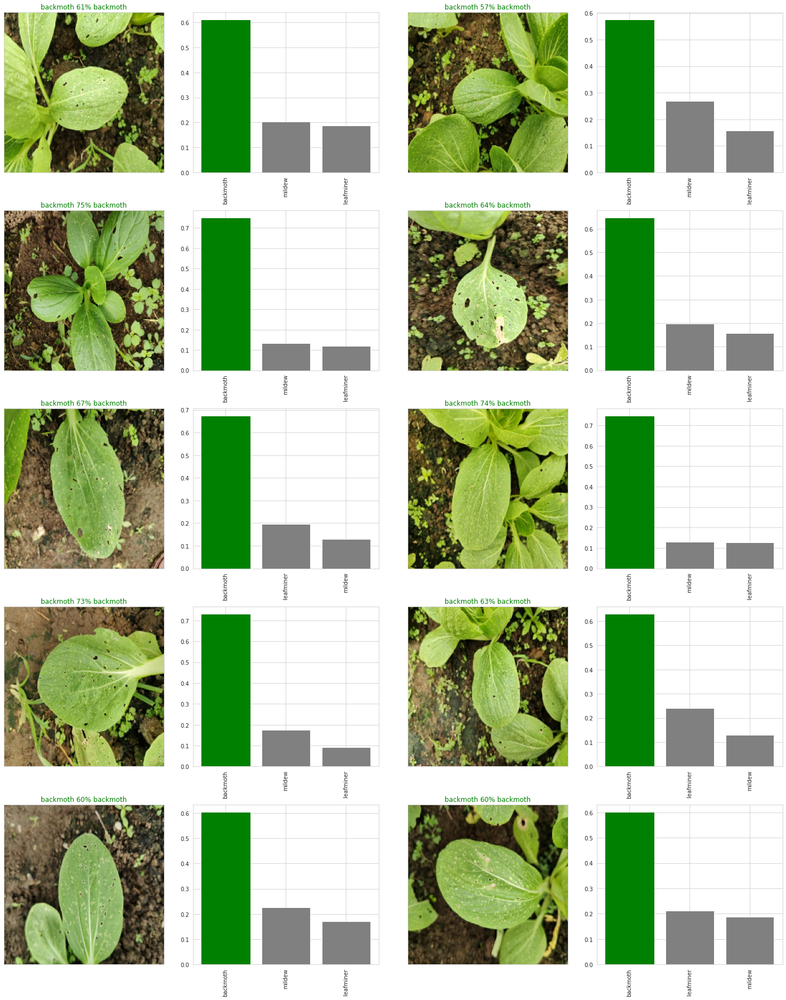

In [84]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 5
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [45]:
scorer(model_imagegen_mobilenetv2)

19/19 [==============================] - 21s 1s/step


IndexError: ignored

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE


# New Section

In [85]:
explainer = lime_image.LimeImageExplainer()

In [86]:
sample_img, sample_label = get_image_label(filenames[0], labels[0])

In [88]:
explanation = explainer.explain_instance(sample_img.numpy().astype('double'), model_imagegen_efficientnetb5.predict,  
                                         top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

(-0.5, 223.5, 223.5, -0.5)

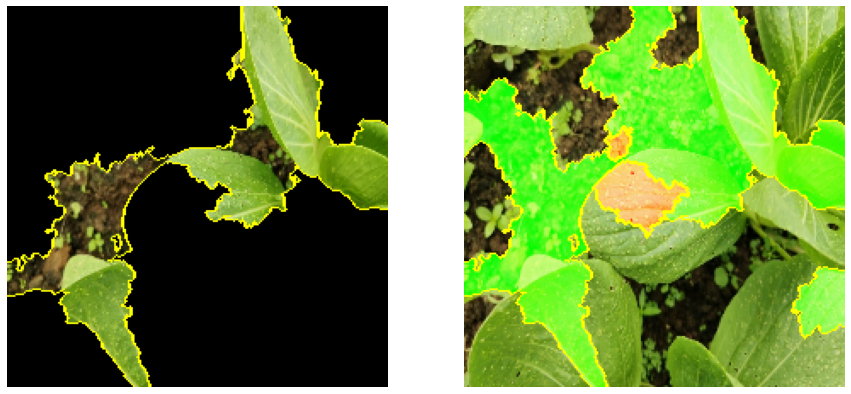

In [89]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')